In [42]:
from PIL import Image
from skimage import measure
import numpy as np 
import pandas as pd 
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import sys
from pathlib import Path
%matplotlib inline

In [43]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [44]:
# Import path
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)
    
module_path = str(Path.cwd().parents[0] / "src")
if module_path not in sys.path:
    sys.path.append(module_path)
    

In [45]:
from config import *
import my_io as io

In [46]:
datasets = sorted([str(f) for f in data_raw.iterdir() if f.is_dir()])
datasets = [name.split('\\')[-1] for name in datasets]
print(datasets)

['DT1', 'DT2', 'DT3', 'DT4', 'DT5', 'DT6', 'NT1', 'NT2', 'NT3', 'NT4', 'NT5', 'NT6']


In [47]:
experiment = datasets[2]

# Topographic map

In [48]:
# Experiment
markers = []
imgs = []    
masks = []

for (dirpath, dirnames, filenames) in os.walk(data_raw / experiment):
    for name in sorted(filenames):
        if 'tiff' in name and experiment in name:
            img = cv2.imread(os.path.join(dirpath,name),0)
            img = cv2.GaussianBlur(img, (21,21),0)
            imgs.append(img)
            markers.append(name.split('_')[1].split('.')[0])
            

for (dirpath, dirnames, filenames) in os.walk(data_mask / experiment):
    for name in sorted(filenames):
        if 'tiff' in name and experiment in name:        
            img = cv2.imread(os.path.join(dirpath,name),0)
            masks.append(img)

# Read cell mask image 
for (dirpath, dirnames, filenames) in os.walk(data_cell_mask):
    for name in sorted(filenames):
        if  'tiff' in name and experiment in name:
            cell_mask = np.array(Image.open(os.path.join(dirpath,name)))
            
data = np.stack(imgs, axis=2)
            
        
# Get cell with mask
cell_masks = []
for i in range(len(masks)):
# Apply cluster mask 
    res = cv2.bitwise_and(cell_mask,cell_mask,mask = masks[i])

    cell_masks.append(res)

# Apply mask
data2 = None
for i in range(len(masks)):
# Apply cluster mask 
    img = cv2.bitwise_and(data[:,:,i], data[:,:,i], mask = masks[i])
    data2 = np.concatenate((data2, img[:,:,None]), axis=2) if data2 is not None else img[:,:,None]
    
binary_masks = []
for i in range(len(cell_masks)):
    binary_masks.append(np.where(cell_masks[i] > 0, 1, 0) )
    
all_mask = sum(binary_masks)
X = [i for i in range(all_mask.shape[0])]
Y = [i for i in range(all_mask.shape[1])]

In [49]:
# Get the position of pankeratin, granzymeB and CD44 markers
for i, ele in enumerate(markers):
    if ele =='Pankeratin':
        n_pank = i
    elif ele == 'GranzymeB':
        n_gra = i
    elif ele == 'CD44':
        n_cd = i

In [50]:
# Define transparent colormap

colors = [(1,0,0,c) for c in np.linspace(0,1,100)]
cmapred = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=255)
colors = [(0,0,1,c) for c in np.linspace(0,1,100)]
cmapblue = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=255)
colors = [(0,1,0,c) for c in np.linspace(0,1,100)]
cmapgreen = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=255)

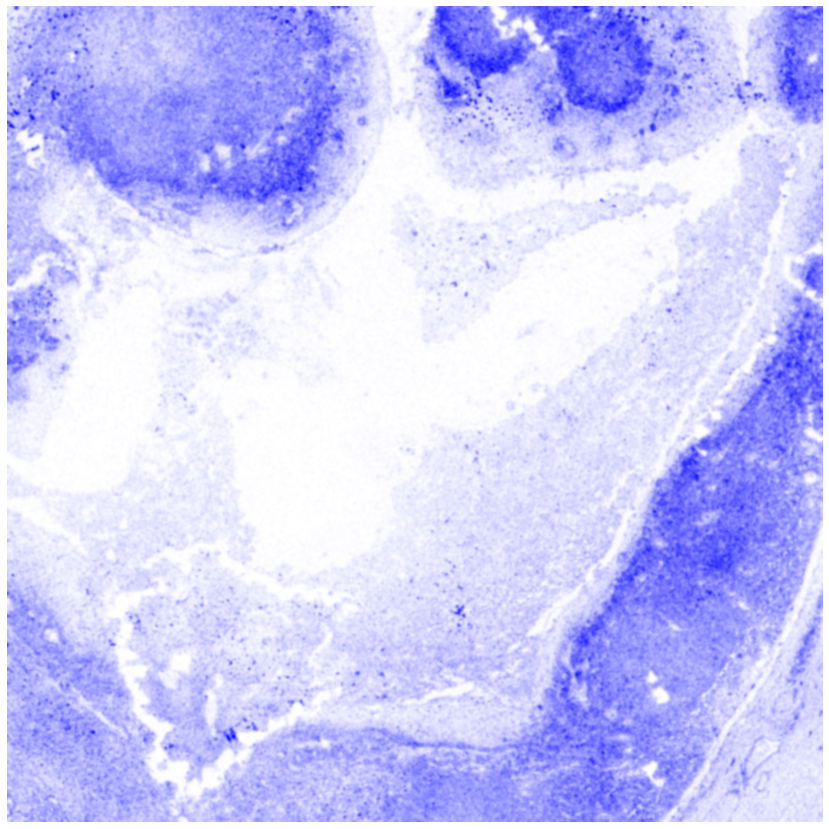

In [51]:
fig, ax = plt.subplots(figsize=(15,15))
ax.axis('off')
# ax.imshow(np.where(cell_mask>0, 100, 0), cmap=plt.get_cmap('gray'), alpha = 0.8, vmin = 0 ,vmax = 255)
ax.imshow(data[:,:,n_cd], cmap=cmapblue, vmin = 0 ,vmax = data[:,:,n_cd].max())
# ax.imshow(data[:,:,n_pank], cmap=cmapred, vmin = 0 ,vmax = data[:,:,n_pank].max())
# ax.imshow(data[:,:,n_gra], cmap=cmapgreen, vmin = 0 ,vmax = data[:,:,n_gra].max())

# fig.savefig(experiment + '_cell.png', bbox_inches='tight') 

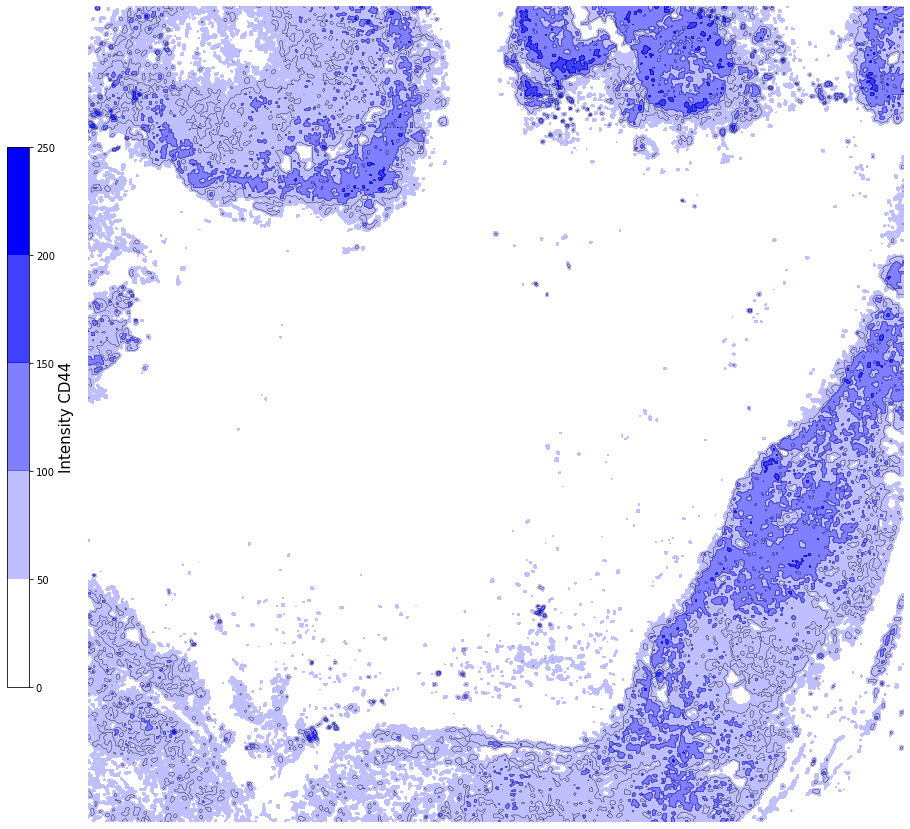

In [52]:
# Define transparent colormap

n_color = 4

colors = [(1,0,0,c) for c in np.linspace(0,1,100)]
cmapred = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=n_color+1)
colors = [(0,0,1,c) for c in np.linspace(0,1,100)]
cmapblue = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=n_color+1)
colors = [(0,1,0,c) for c in np.linspace(0,1,100)]
cmapgreen = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=n_color+1)

contours_level = [i*50 for i in range(n_color+2)]

fig, ax = plt.subplots(figsize=(15,15))
ax.axis('off')
ax.imshow(np.where(cell_mask>0, 100, 0), cmap=plt.get_cmap('gray'), alpha = 0.0, vmin = 0 ,vmax = 255)
ctr1 = ax.contourf(X, Y, data[:,:,n_cd], contours_level, cmap=cmapblue, vmin = 0, vmax = 255);
ax.contour(X, Y,  data2[:,:,n_cd], ctr1.levels, colors='k', linewidths = 0.2)
# ctr2 = ax.contourf(X, Y, data[:,:,n_pank], contours_level, cmap=cmapred, vmin = 0, vmax = 255);
# ax.contour(X, Y,  data2[:,:,n_pank], ctr2.levels, colors='k', linewidths = 0.2)
# ctr3 = ax.contourf(X, Y, data[:,:,n_gra], contours_level, cmap=cmapgreen, vmin = 0, vmax = 255);
# ax.contour(X, Y,  data2[:,:,n_gra], ctr3.levels, colors='k', linewidths = 0.2)

# Add colorbar to figure 
axins1 = fig.add_axes([0.06, 0.25, 0.02, 0.5])
# axins2 = fig.add_axes([0.25, 0.1, 0.5, 0.02])
# axins3 = fig.add_axes([0.9, 0.25, 0.02, 0.5])

cb1 = fig.colorbar(ctr1, cax=axins1, orientation="vertical")
# cb2 = fig.colorbar(ctr2, cax=axins2, orientation="horizontal")
# cb3 = fig.colorbar(ctr3, cax=axins3, orientation="vertical")

cb1.set_label(label = 'Intensity CD44', size=15)
# cb2.set_label(label = 'Intensity Pankeratin', size=15)
# cb3.set_label(label = 'Intensity Granzyme B', size=15)

# fig.savefig(experiment + '_altitude.png', bbox_inches='tight') 

In [53]:
contours, hierarchy = cv2.findContours(cell_mask.astype(np.int32), cv2.RETR_FLOODFILL, cv2.CHAIN_APPROX_NONE)

(-0.5, 2499.5, 2499.5, -0.5)

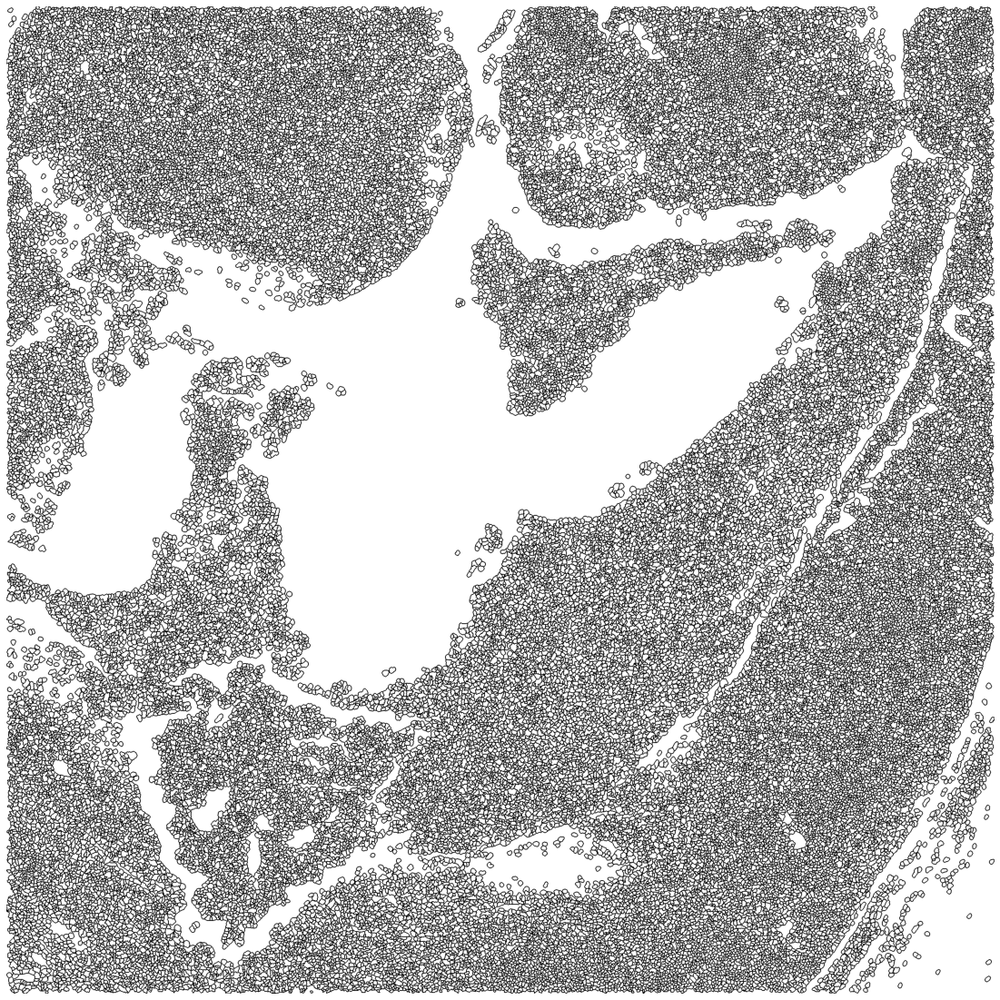

In [54]:
height,width = cell_mask.shape
canvas = np.ones((height,width,3), np.uint8)*255
canvas = cv2.drawContours(canvas, contours, -1, (0,0,0), 1)
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(canvas)
ax.axis('off')

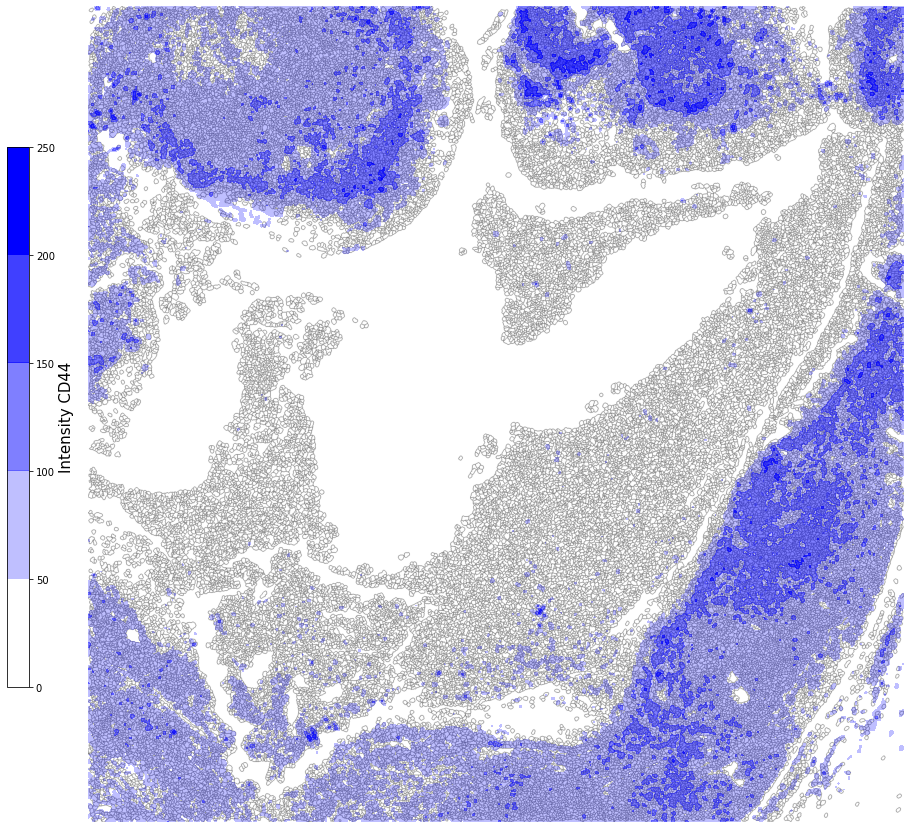

In [55]:
# Define transparent colormap

fig, ax = plt.subplots(figsize=(15,15))
ax.axis('off')
ax.imshow(canvas, alpha=0.5)
ctr1 = ax.contourf(X, Y, data[:,:,n_cd], contours_level, cmap=cmapblue, vmin = 0, vmax = 255);
# ctr2 = ax.contourf(X, Y, data[:,:,n_pank], contours_level, cmap=cmapred, vmin = 0, vmax = 255);
# ctr3 = ax.contourf(X, Y, data[:,:,n_gra], contours_level, cmap=cmapgreen, vmin = 0, vmax = 255);

# Add colorbar to figure 
axins1 = fig.add_axes([0.06, 0.25, 0.02, 0.5])
# axins2 = fig.add_axes([0.25, 0.1, 0.5, 0.02])
# axins3 = fig.add_axes([0.9, 0.25, 0.02, 0.5])

cb1 = fig.colorbar(ctr1, cax=axins1, orientation="vertical")
# cb2 = fig.colorbar(ctr2, cax=axins2, orientation="horizontal")
# cb3 = fig.colorbar(ctr3, cax=axins3, orientation="vertical")

cb1.set_label(label = 'Intensity CD44', size=15)
# cb2.set_label(label = 'Intensity Pankeratin', size=15)
# cb3.set_label(label = 'Intensity Granzyme B', size=15)

# fig.savefig(experiment + '_altitude.png', bbox_inches='tight') 

# 3D plot

In [56]:
from skimage.transform import rescale

def get_step_image(img, ctr):
    levels = np.append(ctr.levels, [255.])

    for i in range(len(levels[1:])):
        img = np.where((levels[i-1] <= img) & (img < levels[i]), levels[i-1], img)
    return img/10


In [57]:
scale = 0.2

img_cd = get_step_image(rescale(data[:,:,n_cd], scale, anti_aliasing=False) * 255, ctr1)
# img_pa = get_step_image(rescale(data[:,:,n_pank], scale, anti_aliasing=False) * 255, ctr2)
# img_ga = get_step_image(rescale(data[:,:,n_gra], scale, anti_aliasing=False) * 255, ctr3)
canvas_re = rescale(canvas, scale, anti_aliasing=False, preserve_range=True, multichannel=True) 

# img_cd = get_step_image(data[:,:,n_cd], ctr1)
# img_pa = get_step_image(data[:,:,n_pank], ctr2)
# img_ga = get_step_image(data[:,:,n_gra], ctr3)

In [58]:
canvas_re.shape

(500, 500, 3)

In [59]:
x = np.arange(img_cd.shape[0])
x = x[::-1]
y = np.arange(img_cd.shape[1])

In [64]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Surface(x=x, y=y, z=img_cd, colorscale='Blues', 
                                 contours = {"z": {"show": True, "start": 0, "end": 25, "size": 5}},
                                ),
#                      go.Surface(x=x, y=y, z=img_ga, colorscale='Greens',
#                                contours = {"z": {"show": True, "start": 0, "end": 25, "size": 5}},
#                                 opacity=0.95
#                                ),
#                      go.Surface(x=x, y=y, z=img_pa, colorscale='Reds',
#                                contours = {"z": {"show": True, "start": 0, "end": 25, "size": 5}},
#                                 opacity=0.95
#                                )
                     ]
               )

# Set figure size
fig.update_layout(autosize=False,
                  width=1000, height=1000,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )

# No color bar
fig.update_traces(showscale=False)

x_eye = 0
y_eye = 2
z_eye = 4

# x_eye = 0
# y_eye = 0
# z_eye = 4

# Set white background and no axis for 3d plot
fig.update_layout(template='simple_white', plot_bgcolor='rgba(0,0,0,0)',
                  scene_camera_eye=dict(x=x_eye, y=y_eye, z=z_eye),
                  scene =  {'aspectmode':'data',
                            'xaxis_title': '',
                            'yaxis_title': '',
                            'zaxis_title': '',
                            'xaxis': {'backgroundcolor': 'white',
                                    'gridcolor': 'rgb(0,0,0)',
                                    'gridwidth': 2,
                                    'linecolor': 'rgb(0,0,0)',
                                    'showbackground': True,
                                    'showgrid': False,
                                    'showline': False,
                                    'showticklabels': False,
                                    'ticks': '',
                                    'zeroline': False,
                                    'zerolinecolor': 'rgb(0,0,0)'},
                            'yaxis': {'backgroundcolor': 'white',
                                    'gridcolor': 'rgb(0,0,0)',
                                    'gridwidth': 2,
                                    'linecolor': 'rgb(0,0,0)',
                                    'showbackground': True,
                                    'showgrid': False,
                                    'showline': False,
                                    'showticklabels': False,
                                    'ticks': '',
                                    'zeroline': False,
                                    'zerolinecolor': 'rgb(0,0,0)'},
                            'zaxis': {'backgroundcolor': 'white',
                                    'gridcolor': 'rgb(0,0,0)',
                                    'gridwidth': 2,
                                    'linecolor': 'rgb(0,0,0)',
                                    'showbackground': True,
                                    'showgrid': False,
                                    'showline': False,
                                    'showticklabels': False,
                                    'ticks': '',
                                    'zeroline': False,
                                    'zerolinecolor': 'rgb(0,0,0)'}}
                 )

fig.show()
# fig.write_html(f"{experiment}_3d_plot.html")